In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

!pip install requests

import torch
import torchvision
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO

import glob



COCO_CLASSES_ACTUAL = [
    '__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'dining table', 'dog', 'horse', 'motorbike',
    'person', 'potted plant', 'sheep', 'sofa', 'train', 'tv monitor'
]



TARGET_GARBAGE_CLASSES_MAP_WEIGHTED = {

    'dustbin_overflow': (1, 15),
    'garbage_pile': (2, 12),
    'spilled_waste_road': (3, 10),
    'dustbin_damaged': (4, 8),


    'chair': (9, 6),
    'potted plant': (16, 4),
    'bottle': (5, 2),
}

GARBAGE_SEGMENT_IDS = [item[0] for item in TARGET_GARBAGE_CLASSES_MAP_WEIGHTED.values()]

print("WARNING: The model is trained on COCO (21 classes), NOT your custom list.")
print("The classes 'dustbin_overflow', 'garbage_pile', etc., WILL NOT be accurately detected.")
print("-" * 50)




def load_model():
    """Loads a pre-trained DeepLabV3 model and sets it to evaluation mode."""
    print("Loading DeepLabV3 COCO model...")
    try:
        model = torchvision.models.segmentation.deeplabv3_resnet101(
            weights=torchvision.models.segmentation.DeepLabV3_ResNet101_Weights.DEFAULT
        )
        model.eval()
        print("Model loaded successfully.")
        return model
    except Exception as e:
        print(f"Error loading model: {e}")
        return None

def get_segmentation_mask(model, image_path_or_url):
    """Loads and preprocesses an image, runs segmentation."""
    try:
        if image_path_or_url.startswith('http'):
            response = requests.get(image_path_or_url)
            img = Image.open(BytesIO(response.content)).convert("RGB")
        else:
            img = Image.open(image_path_or_url).convert("RGB")
    except Exception as e:
        print(f" Error: Could not load image from path/URL: {e}")
        return None, None

    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    input_tensor = preprocess(img)
    input_batch = input_tensor.unsqueeze(0)

    with torch.no_grad():
        output = model(input_batch)['out'][0]

    output_predictions = output.argmax(0)

    return img, output_predictions.cpu().numpy()



The classes 'dustbin_overflow', 'garbage_pile', etc., WILL NOT be accurately detected.
--------------------------------------------------


In [ ]:
def calculate_urgency_level(found_objects):
    """Calculates the total score and assigns an urgency level."""


    total_score = 0
    urgency_map_reverse = {v[0]: (k, v[1]) for k, v in TARGET_GARBAGE_CLASSES_MAP_WEIGHTED.items()}

    for obj_name in found_objects:
        for name, (idx, weight) in TARGET_GARBAGE_CLASSES_MAP_WEIGHTED.items():
            if name == obj_name:
                total_score += weight
                break

    # Define Thresholds and Level
    if total_score >= 15:
        level = "EMERGENCY"
        color = 'red'
    elif total_score >= 10:
        level = "HIGH"
        color = 'orange'
    elif total_score >= 5:
        level = "MEDIUM"
        color = 'yellow'
    elif total_score > 0:
        level = "LOW"
        color = 'green'
    else:
        level = "NONE"
        color = 'gray'

    return level, total_score, color




def visualize_and_verify_garbage(original_img, mask_array):
    """
    Visualizes the segmentation mask and calculates the urgency level.
    """

    rgb_mask = np.zeros((*mask_array.shape, 3), dtype=np.uint8)
    is_litter_found = False
    found_objects = set()

    # Check for and color only the targeted litter classes
    for class_name, (class_id, weight) in TARGET_GARBAGE_CLASSES_MAP_WEIGHTED.items():
        if class_id in mask_array:
            # Color the matching pixels **Magenta** [255, 0, 255]
            rgb_mask[mask_array == class_id] = [255, 0, 255]
            is_litter_found = True
            found_objects.add(class_name)

    # Calculate urgency
    urgency_level, total_score, urgency_color = calculate_urgency_level(found_objects)

    # --- Console Output ---
    print("\n--- Garbage Detection Results ---")
    print(f"✅ Detection Status: {'POTENTIAL WASTE/LITTER FOUND' if is_litter_found else 'CLEAN'}")
    print(f"   Detected Proxies: {', '.join(sorted(list(found_objects))) or 'None'}")
    print(f"   Total Urgency Score: {total_score}")
    print(f"   CLEANING URGENCY: {urgency_level}")
    print("--------------------------------")

    # --- Plotting ---
    original_np = np.array(original_img)

    # Blend the original image and the mask (50% transparency)
    alpha = 0.5
    blended_img = (original_np * (1 - alpha) + rgb_mask * alpha).astype(np.uint8)

    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    axes[0].imshow(original_np)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(blended_img)
    axes[1].set_title("Segmentation Mask Overlay (Waste/Litter in Magenta)")
    axes[1].axis('off')

    plt.suptitle(
        f"CLEANING URGENCY LEVEL: **{urgency_level}** (Score: {total_score})\n"
        f"Detected Items: {', '.join(sorted(list(found_objects))) or 'None'}",
        fontsize=16,
        color=urgency_color
    )
    plt.show()



Loading DeepLabV3 COCO model...
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


100%|██████████| 233M/233M [00:01<00:00, 179MB/s]


Model loaded successfully.

Processing Image: /content/drive/MyDrive/Hackathon/d1.jpg

--- Garbage Detection Results ---
✅ Detection Status: CLEAN
   Detected Proxies: None
   Total Urgency Score: 0
   CLEANING URGENCY: NONE
--------------------------------


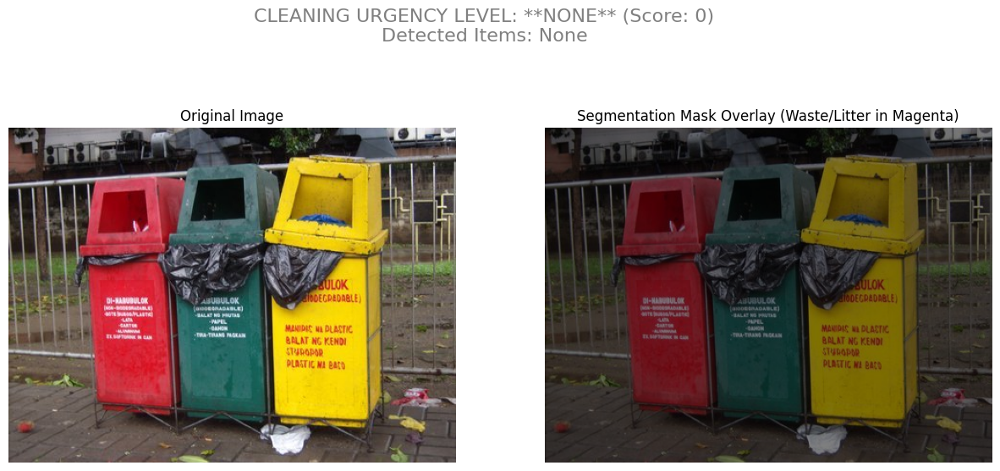


Processing Image: /content/drive/MyDrive/Hackathon/newdustbin.jpg

--- Garbage Detection Results ---
✅ Detection Status: CLEAN
   Detected Proxies: None
   Total Urgency Score: 0
   CLEANING URGENCY: NONE
--------------------------------


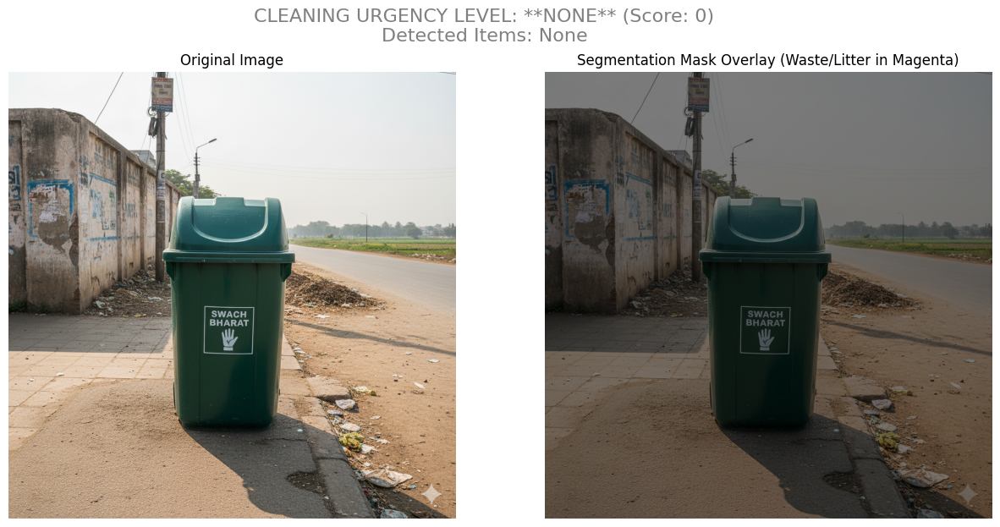


Processing Image: /content/drive/MyDrive/Hackathon/wastecleared.jpg

--- Garbage Detection Results ---
✅ Detection Status: POTENTIAL WASTE/LITTER FOUND
   Detected Proxies: garbage_pile
   Total Urgency Score: 12
   CLEANING URGENCY: HIGH
--------------------------------


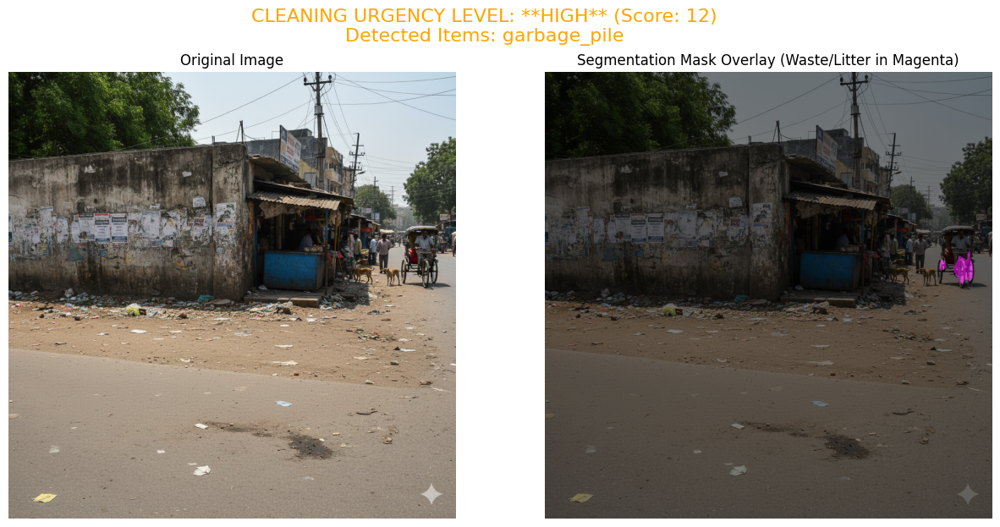


Processing Image: /content/drive/MyDrive/Hackathon/overflowingbin.jpg

--- Garbage Detection Results ---
✅ Detection Status: POTENTIAL WASTE/LITTER FOUND
   Detected Proxies: garbage_pile
   Total Urgency Score: 12
   CLEANING URGENCY: HIGH
--------------------------------


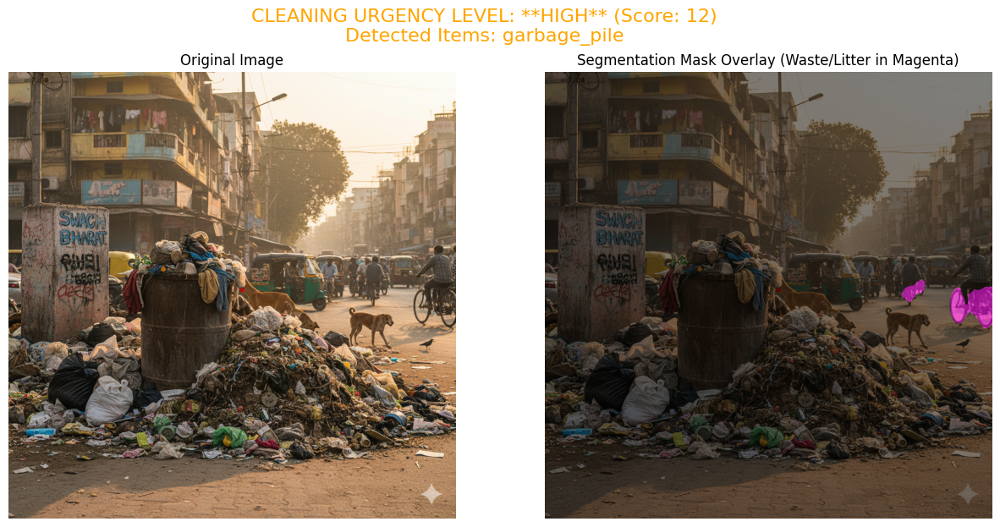


Processing Image: /content/drive/MyDrive/Hackathon/damagedbin.jpg

--- Garbage Detection Results ---
✅ Detection Status: POTENTIAL WASTE/LITTER FOUND
   Detected Proxies: garbage_pile
   Total Urgency Score: 12
   CLEANING URGENCY: HIGH
--------------------------------


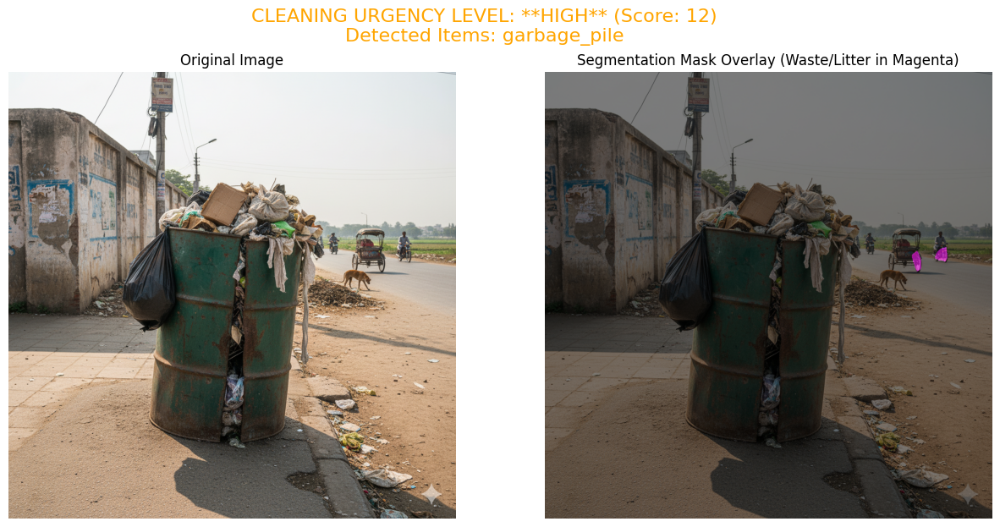


Processing Image: /content/drive/MyDrive/Hackathon/nooverflow.jpg

--- Garbage Detection Results ---
✅ Detection Status: POTENTIAL WASTE/LITTER FOUND
   Detected Proxies: garbage_pile
   Total Urgency Score: 12
   CLEANING URGENCY: HIGH
--------------------------------


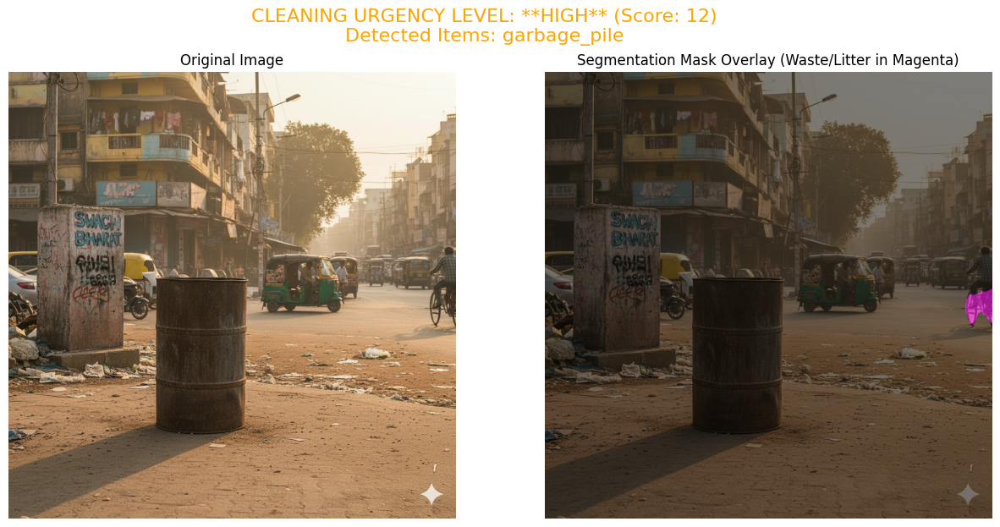


Processing Image: /content/drive/MyDrive/Hackathon/wastespilled.jpg

--- Garbage Detection Results ---
✅ Detection Status: POTENTIAL WASTE/LITTER FOUND
   Detected Proxies: garbage_pile
   Total Urgency Score: 12
   CLEANING URGENCY: HIGH
--------------------------------


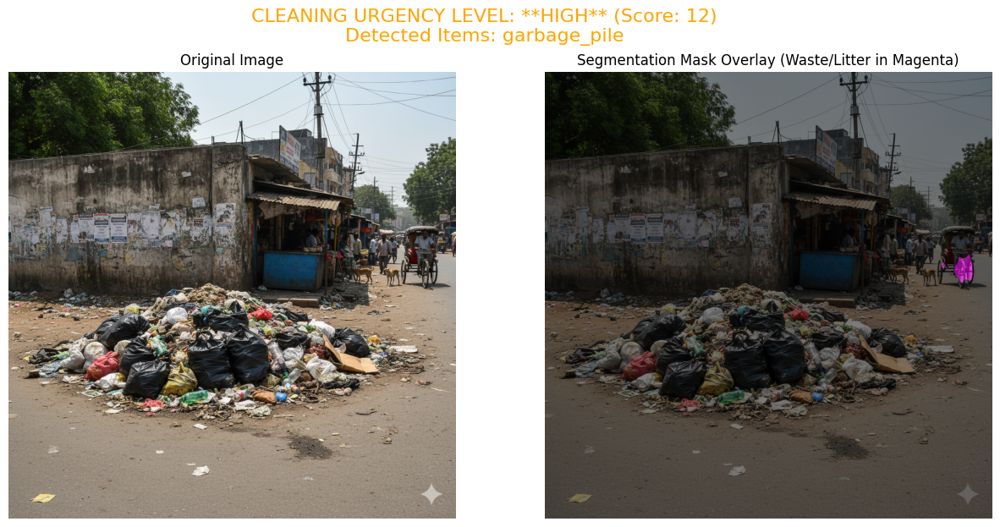


Processing Image: /content/drive/MyDrive/Hackathon/l2.jpg

--- Garbage Detection Results ---
✅ Detection Status: CLEAN
   Detected Proxies: None
   Total Urgency Score: 0
   CLEANING URGENCY: NONE
--------------------------------


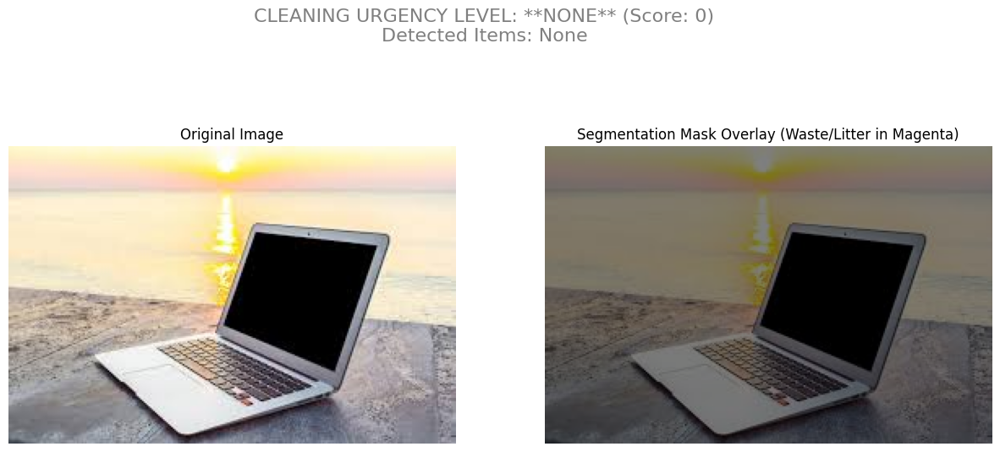


Processing Image: /content/drive/MyDrive/Hackathon/m.jpg

--- Garbage Detection Results ---
✅ Detection Status: CLEAN
   Detected Proxies: None
   Total Urgency Score: 0
   CLEANING URGENCY: NONE
--------------------------------


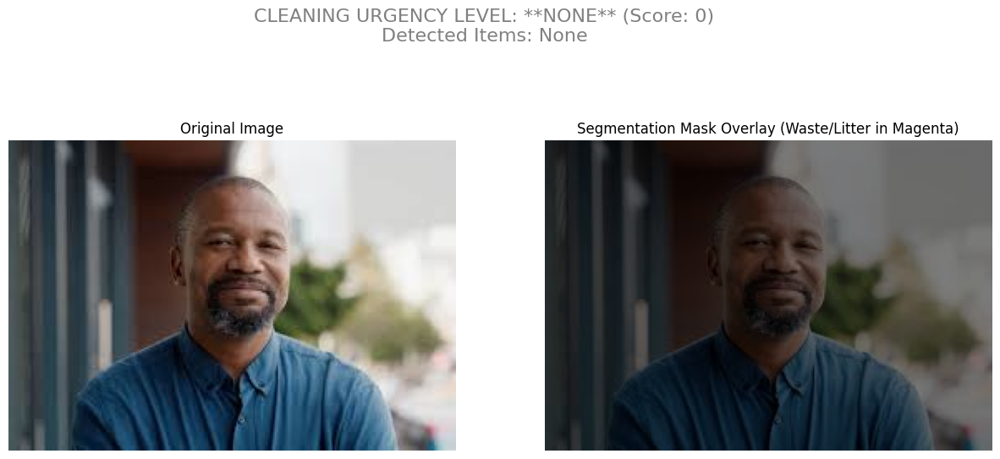

In [ ]:
# --- EXECUTION ---


FOLDER_PATH_PATTERN = "/content/drive/MyDrive/Hackathon/*.jpg"


model = load_model()

if model:
    image_files = glob.glob(FOLDER_PATH_PATTERN)

    if not image_files:
        print(f"❌ Error: No image files found matching the pattern: {FOLDER_PATH_PATTERN}")


    for IMAGE_SOURCE in image_files:
        print("\n" + "=" * 80)
        print(f"Processing Image: {IMAGE_SOURCE}")

        original_img, mask_array = get_segmentation_mask(model, IMAGE_SOURCE)

        if mask_array is not None:
            visualize_and_verify_garbage(original_img, mask_array)
        else:
            print(f"Skipping visualization for {IMAGE_SOURCE} due to load error.")

